In [15]:
from tifffile import imread, imsave
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL as Image

'/mnt/c/Users/ankit/Desktop/Msc AIML/Data'

In [2]:
data = imread('/mnt/c/Users/ankit/Desktop/Msc AIML/Data/idr0076-ali-metabric/20191219-ftp/METABRIC_IMC/to_public_repository/full_stacks/MB0040_1_165_fullstack.tiff')

In [3]:
data.shape

(50, 563, 588)

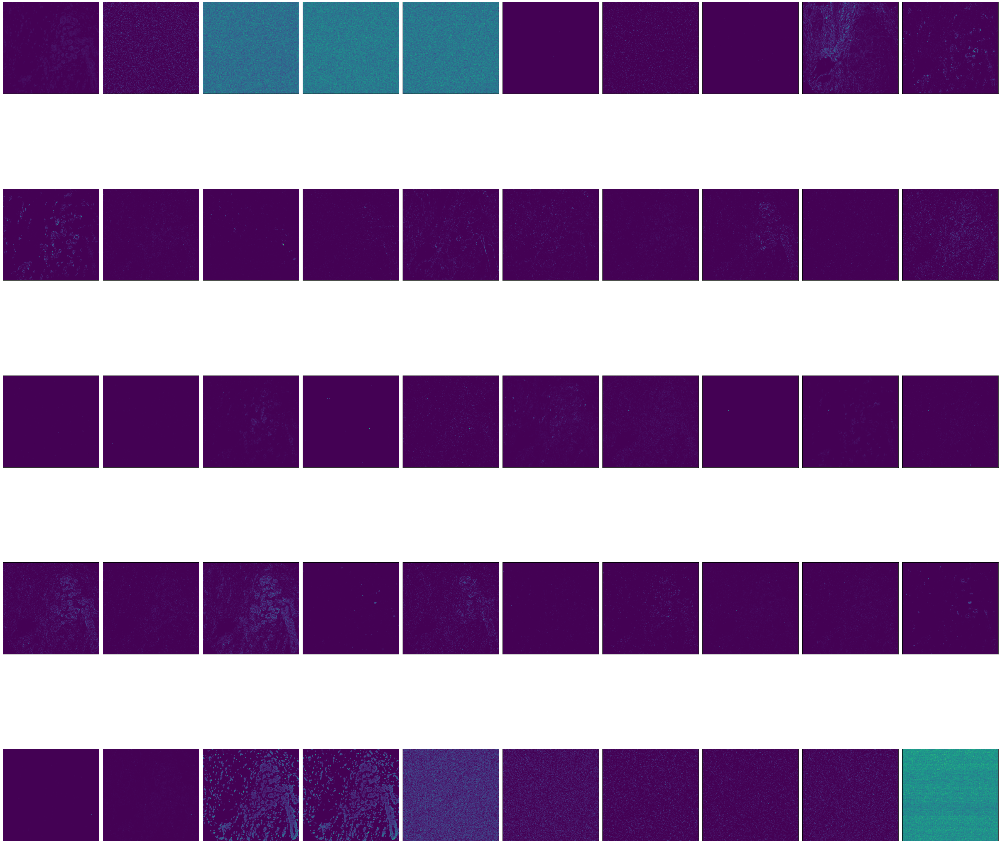

In [4]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(50, 50), tight_layout=True)
plt.subplots_adjust(wspace=0.0005, hspace=0.1)
for i in range(50):
    ax = fig.add_subplot(5, 10, i+1)
    ax.imshow(data[i])
    ax.set_xticks([])
    ax.set_yticks([])
plt.show()

In [5]:
# data_mask = imread('/mnt/c/Users/ankit/Desktop/Msc AIML/Data/idr0076-ali-metabric/20191219-ftp/METABRIC_IMC/to_public_repository/cell_masks/MB0040_1_165_cellmask.tiff')

In [6]:
cov_data = imread('/mnt/c/Users/ankit/Desktop/Msc AIML/Data/convallaria/trainingDataGT.tif')

In [7]:
cov_data.shape

(1536, 512, 512)

In [8]:
len(np.unique(cov_data[500:520], axis = 0)), len(np.unique(cov_data[1020:1040], axis = 0))

(2, 2)

3 unique images for the training set!

In [9]:
len(np.unique(data, axis = 0))

50

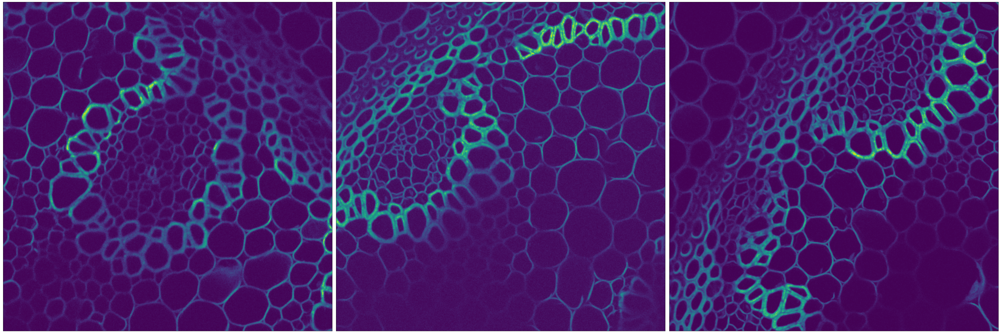

In [10]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(50, 50), tight_layout=True)
plt.subplots_adjust(wspace=0.0005, hspace=0.1)
for i in range(3):
    ax = fig.add_subplot(1, 3, i+1)
    ax.imshow(cov_data[510*(i+1)])
    ax.set_xticks([])
    ax.set_yticks([])
plt.show()

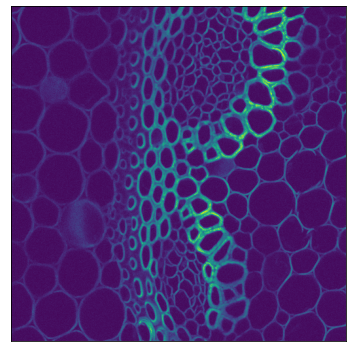

In [11]:
cov_test_data = imread('/mnt/c/Users/ankit/Desktop/Msc AIML/Data/convallaria/testDataGT.tif')
fig = plt.figure(figsize=(5, 5), tight_layout=True)
plt.imshow(cov_test_data[0])
plt.xticks([])
plt.yticks([])
plt.show()

In [12]:
# len(np.unique(cov_test_data, axis = 0))

In [29]:
def get_smallest_dimensions(folder_path):
    min_width, min_height = float('inf'), float('inf')
    image_files = [f for f in os.listdir(folder_path) if f.endswith('.tiff')]

    for image_file in image_files[:6]:
        image_path = os.path.join(folder_path, image_file)
        print(str(image_path))
        img = imread(image_path)
        _, width, height = img.shape
        if width < min_width:
            min_width = width
        if height < min_height:
            min_height = height

    return min_width, min_height
folder_path = '/mnt/c/Users/ankit/Desktop/Msc AIML/Data/idr0076-ali-metabric/20191219-ftp/METABRIC_IMC/to_public_repository/full_stacks/'
get_smallest_dimensions(folder_path)

/mnt/c/Users/ankit/Desktop/Msc AIML/Data/idr0076-ali-metabric/20191219-ftp/METABRIC_IMC/to_public_repository/full_stacks/MB0000_1_527_fullstack.tiff
/mnt/c/Users/ankit/Desktop/Msc AIML/Data/idr0076-ali-metabric/20191219-ftp/METABRIC_IMC/to_public_repository/full_stacks/MB0002_1_345_fullstack.tiff
/mnt/c/Users/ankit/Desktop/Msc AIML/Data/idr0076-ali-metabric/20191219-ftp/METABRIC_IMC/to_public_repository/full_stacks/MB0005_1_211_fullstack.tiff
/mnt/c/Users/ankit/Desktop/Msc AIML/Data/idr0076-ali-metabric/20191219-ftp/METABRIC_IMC/to_public_repository/full_stacks/MB0010_1_420_fullstack.tiff
/mnt/c/Users/ankit/Desktop/Msc AIML/Data/idr0076-ali-metabric/20191219-ftp/METABRIC_IMC/to_public_repository/full_stacks/MB0013_1_371_fullstack.tiff
/mnt/c/Users/ankit/Desktop/Msc AIML/Data/idr0076-ali-metabric/20191219-ftp/METABRIC_IMC/to_public_repository/full_stacks/MB0014_1_326_fullstack.tiff


(378, 428)

In [35]:

def crop_and_concatenate_images(folder_path, output_path):

    image_files = [f for f in os.listdir(folder_path) if f.endswith('.tiff')]
    min_width, min_height = get_smallest_dimensions(folder_path)

    image_arrays = []
    print(str(image_files[:6]))
    for image_file in image_files[:6]:
        image_path = os.path.join(folder_path, image_file)
        img = imread(image_path)
        print(img.shape)
        cropped_img = img[:, 0:min_width, 0:min_height]
        image_array = np.array(cropped_img)
        image_arrays.append(image_array)

    concatenated_image_array = np.concatenate(image_arrays, axis=0)

    concatenated_image = np.array(concatenated_image_array)
    imsave('/mnt/c/Users/ankit/Desktop/Msc AIML/Data/breast-cancer/trainingData.tiff',concatenated_image, imagej = True)
    print(f"final concatenated image shape: {concatenated_image.shape}")

folder_path = '/mnt/c/Users/ankit/Desktop/Msc AIML/Data/idr0076-ali-metabric/20191219-ftp/METABRIC_IMC/to_public_repository/full_stacks/'
output_path = '/mnt/c/Users/ankit/Desktop/Msc AIML/Data/breast-cancer/trainingData.tiff'

crop_and_concatenate_images(folder_path, output_path)

/mnt/c/Users/ankit/Desktop/Msc AIML/Data/idr0076-ali-metabric/20191219-ftp/METABRIC_IMC/to_public_repository/full_stacks/MB0000_1_527_fullstack.tiff
/mnt/c/Users/ankit/Desktop/Msc AIML/Data/idr0076-ali-metabric/20191219-ftp/METABRIC_IMC/to_public_repository/full_stacks/MB0002_1_345_fullstack.tiff
/mnt/c/Users/ankit/Desktop/Msc AIML/Data/idr0076-ali-metabric/20191219-ftp/METABRIC_IMC/to_public_repository/full_stacks/MB0005_1_211_fullstack.tiff
/mnt/c/Users/ankit/Desktop/Msc AIML/Data/idr0076-ali-metabric/20191219-ftp/METABRIC_IMC/to_public_repository/full_stacks/MB0010_1_420_fullstack.tiff
/mnt/c/Users/ankit/Desktop/Msc AIML/Data/idr0076-ali-metabric/20191219-ftp/METABRIC_IMC/to_public_repository/full_stacks/MB0013_1_371_fullstack.tiff
/mnt/c/Users/ankit/Desktop/Msc AIML/Data/idr0076-ali-metabric/20191219-ftp/METABRIC_IMC/to_public_repository/full_stacks/MB0014_1_326_fullstack.tiff
['MB0000_1_527_fullstack.tiff', 'MB0002_1_345_fullstack.tiff', 'MB0005_1_211_fullstack.tiff', 'MB0010_1_42

/tmp/ipykernel_24505/444288483.py:19: DeprecationWarning: <tifffile.imsave> is deprecated. Use tifffile.imwrite
  imsave('/mnt/c/Users/ankit/Desktop/Msc AIML/Data/breast-cancer/trainingData.tiff',concatenated_image, imagej = True)


final concatenated image shape: (300, 378, 428)


In [36]:
train_data = imread('/mnt/c/Users/ankit/Desktop/Msc AIML/Data/breast-cancer/trainingData.tiff')
train_data.shape

(300, 378, 428)

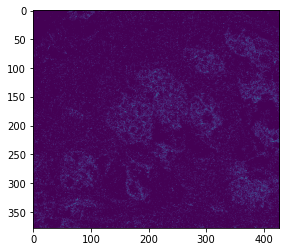

In [52]:
plt.imshow(train_data[280])

In [16]:
bc_data = imread('/mnt/c/Users/ankit/Desktop/Msc AIML/Data/breast-cancer/trainingData.tiff')
bc_data.shape

(300, 378, 428)

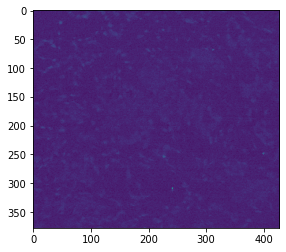

In [30]:
i = 5
plt.imshow(np.sum(bc_data[50*i:50*(i+1)], axis= 0))